# GETTING STARTED

In [41]:
# Importing everything from utils
from utils import *

In [39]:
pd.options.display.max_columns = 54
sns.set(style="white")

In [3]:
df = pd.read_csv('DataCoSupplyChainDataset.csv', encoding='latin-1')

df2 = pd.read_csv('DescriptionDataCoSupplyChain.csv', encoding='latin-1')

df2.replace({'Order Item Total  ': 'Order Item Total'}, inplace=True)

# DATASET ANALYSIS

In [4]:
print(df.shape)
print(df.size)

(180519, 53)
9567507


In [5]:
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [7]:
df.dtypes.value_counts()

object     24
float64    15
int64      14
dtype: int64

In [8]:
df.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


## Data Preparation

In [9]:
# Numeric columns object creation
# ===============================================================================================

df_drop_numerical_cols = ['Category Id',
                          'Customer Id',
                          'Customer Zipcode',
                          'Department Id',
                          'Latitude',
                          'Longitude',
                          'Order Customer Id',
                          'Order Item Cardprod Id',
                          'Order Item Id',
                          'Order Zipcode',
                          'Product Card Id',
                          'Product Category Id',
                          'Product Description',
                          'Product Status'
                          ]

In [10]:
# Numeric columns drop
# ===============================================================================================

df = df.drop(df_drop_numerical_cols, axis=1)

In [11]:
# Create 2 dataframes. One for numbers  other for objects.
# ===============================================================================================

df_numerical_data = df.select_dtypes(include=np.number)


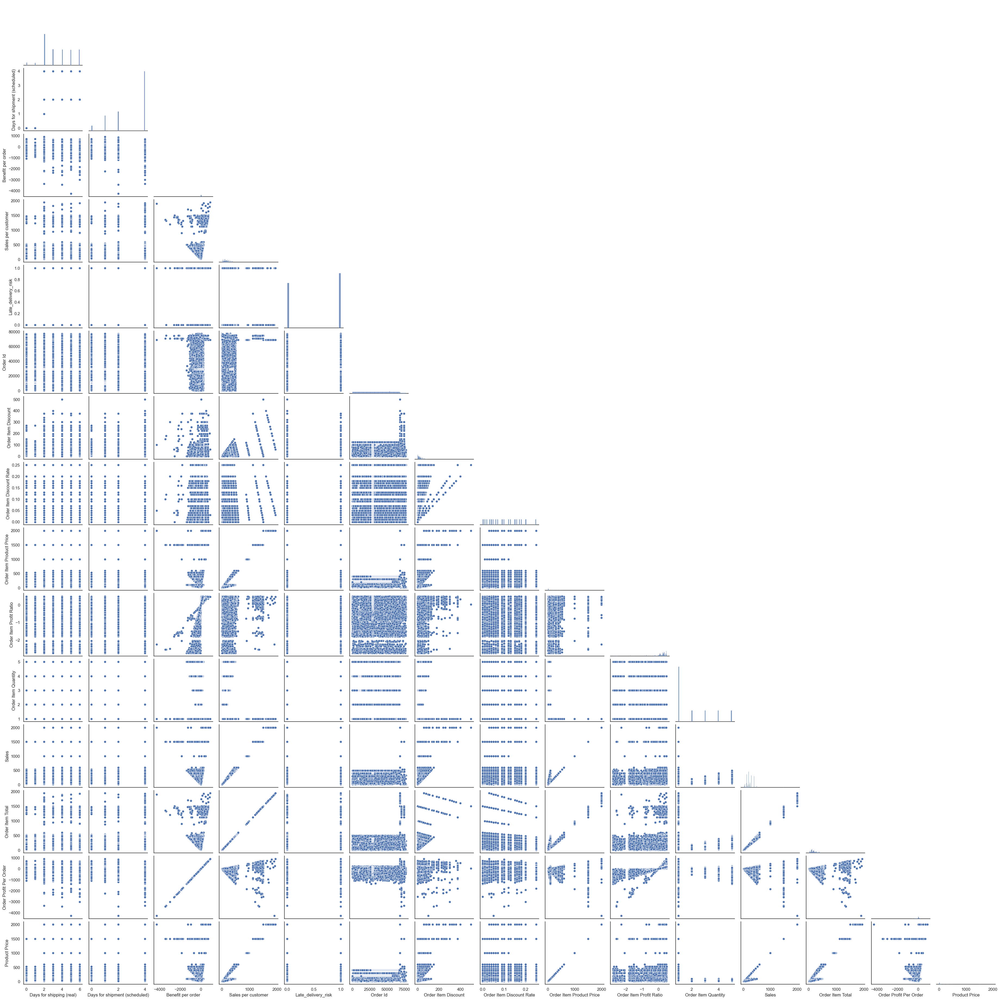

In [13]:
sns.pairplot(df_numerical_data, corner=True)

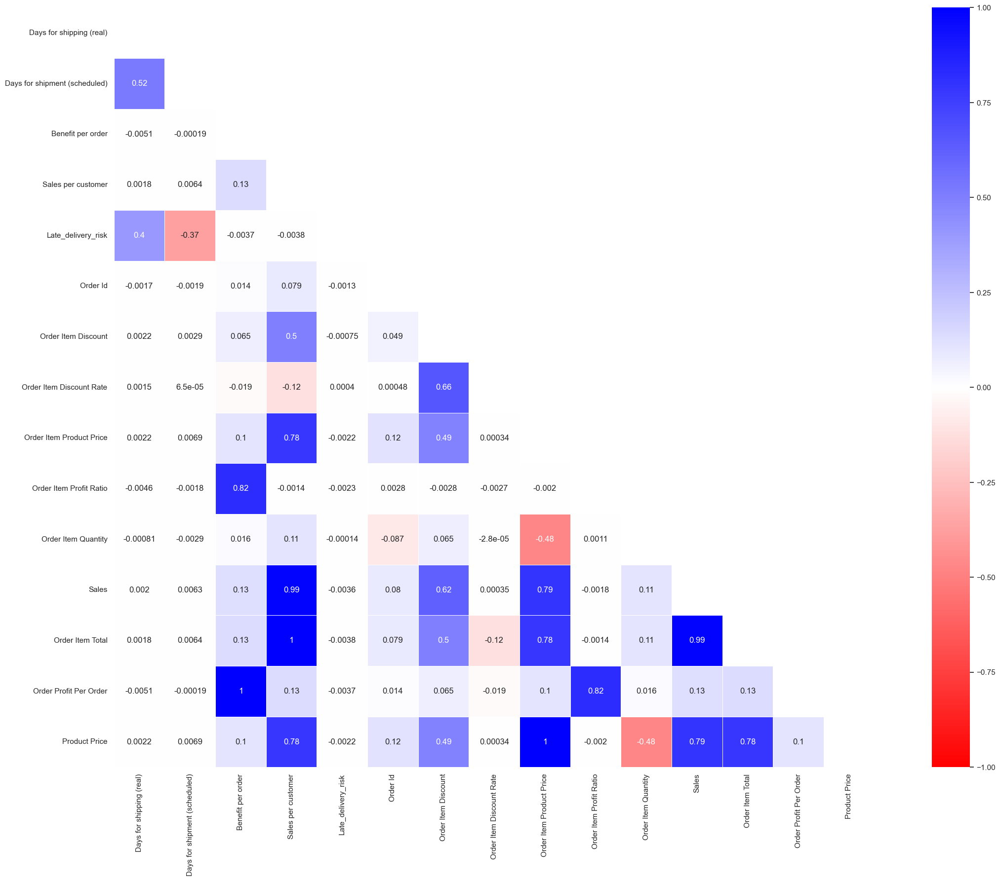

In [14]:
# Heat map to represent better correlation
# ===============================================================================================
corr_df = df_numerical_data.corr()

plt.figure(figsize=(30,20))

#masking the upper traingle part since matrix is symmetric(repetitive) 
mask = np.triu(np.ones_like(corr_df, dtype=bool))
sns.heatmap(df_numerical_data.corr(), mask=mask, square=True, annot=True, vmin=-1, vmax=1, cmap="bwr_r", linewidths=.4);

In [12]:
# Features above 0,75 of correlation
# ===============================================================================================

df_drop_numerical_cols1 = ['Benefit per order',
                           'Sales per customer',
                           'Product Price'
                           ]

In [13]:
df = df.drop(df_drop_numerical_cols1, axis=1)
df_numerical_data = df_numerical_data.drop(df_drop_numerical_cols1, axis=1)

In [14]:
df.describe(exclude=np.number)

,Type,Delivery Status,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Lname,Customer Password,Customer Segment,...,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,Product Image,Product Name,shipping date (DateOrders),Shipping Mode
count,180519,180519,180519,180519,180519,180519,180519,180511,180519,180519,...,180519,180519,180519,180519,180519,180519,180519,180519,180519,180519
unique,4,4,50,563,2,1,782,1109,1,3,...,3597,164,65752,23,1089,9,118,118,63701,4
top,DEBIT,Late delivery,Cleats,Caguas,EE. UU.,XXXXXXXXX,Mary,Smith,XXXXXXXXX,Consumer,...,Santo Domingo,Estados Unidos,12/14/2016 12:29,Central America,Inglaterra,COMPLETE,http://images.acmesports.sports/Perfect+Fitnes...,Perfect Fitness Perfect Rip Deck,1/5/2016 5:58,Standard Class
freq,69295,98977,24551,66770,111146,180519,65150,64104,180519,93504,...,2211,24840,5,28341,6722,59491,24515,24515,10,107752


In [15]:
# Not Numeric columns object creation
# ===============================================================================================

df_drop_not_numerical_cols = ['Customer Email',
                              'Customer Fname',
                              'Customer Lname',
                              'Customer Password', 'Customer Street',
                              'Product Image'
                              ]

In [16]:
# Not Numeric columns drop
# ===============================================================================================

df = df.drop(df_drop_not_numerical_cols, axis=1)

In [17]:
# Create 2 dataframes. One for numbers  other for objects.
# ===============================================================================================

df_object_data = df.select_dtypes(include=object)

In [18]:
df_object_data.head()

,Type,Delivery Status,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Department Name,Market,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,Product Name,shipping date (DateOrders),Shipping Mode
0,DEBIT,Advance shipping,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Fitness,Pacific Asia,Bekasi,Indonesia,1/31/2018 22:56,Southeast Asia,Java Occidental,COMPLETE,Smart watch,2/3/2018 22:56,Standard Class
1,TRANSFER,Late delivery,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Fitness,Pacific Asia,Bikaner,India,1/13/2018 12:27,South Asia,Rajastán,PENDING,Smart watch,1/18/2018 12:27,Standard Class
2,CASH,Shipping on time,Sporting Goods,San Jose,EE. UU.,Consumer,CA,Fitness,Pacific Asia,Bikaner,India,1/13/2018 12:06,South Asia,Rajastán,CLOSED,Smart watch,1/17/2018 12:06,Standard Class
3,DEBIT,Advance shipping,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,Fitness,Pacific Asia,Townsville,Australia,1/13/2018 11:45,Oceania,Queensland,COMPLETE,Smart watch,1/16/2018 11:45,Standard Class
4,PAYMENT,Advance shipping,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,Fitness,Pacific Asia,Townsville,Australia,1/13/2018 11:24,Oceania,Queensland,PENDING_PAYMENT,Smart watch,1/15/2018 11:24,Standard Class


In [22]:
pp.ProfileReport(df_object_data, dark_mode=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
# Not Numeric columns object creation
# ===============================================================================================

df_drop_not_numerical_cols1 = ['Customer City',   # High cardinality. then values are distributed across US States.
                               'Department Name', # High correlation with Category Name. Category Name showcase better the type of products.
                               'Order City',      # High cardinality. Order Country + Order Region will be used instead.
                               'Order State',     # High cardinality. Order Country + Order Region will be used instead.
                               'Product Name'     # High cardinality. Category Name will be used instead.
                              ]

In [20]:
df = df.drop(df_drop_not_numerical_cols1, axis=1)

In [37]:
pp.ProfileReport(df, dark_mode=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
df_numerical_data['Date'], df_numerical_data['Hour'] = df['order date (DateOrders)'].str.split(
    ' ', 1).str

df_numerical_data = df_numerical_data.drop(columns=['Hour'],axis=1)

In [22]:
df_numerical_data['Date'] = pd.to_datetime(df_numerical_data['Date'])

In [23]:
df_numerical_data = df_numerical_data.set_index(['Date'])

In [24]:
df_financial = df_numerical_data.copy()

In [25]:
df_numerical_data = df_numerical_data.groupby('Date').agg(
    {'Sales': ['sum', 'mean', 'min', 'max'],
     'Order Item Profit Ratio': ['mean'],
     'Order Profit Per Order': ['sum', 'mean', 'min', 'max'],
     'Order Item Discount Rate': ['mean'],
     'Order Item Discount': ['sum', 'mean', 'min', 'max'],
     'Order Item Total': ['sum', 'mean', 'min', 'max']})

In [31]:
df_financial = df_financial.groupby('Date').agg(
    {'Sales': 'sum',
     'Order Profit Per Order': 'sum',
     'Order Item Discount': 'sum',
     'Order Item Total': 'sum'})

In [38]:
# df_financial.to_csv('df_financial.csv')

### Datetime Convertion

In [32]:
def date_cols(df_date_col):
    df['Date'] = pd.to_datetime(df['order date (DateOrders)']).dt.date
    df['Date'] = pd.to_datetime(df['Date'])
    df['Year'] = pd.to_datetime(df['order date (DateOrders)']).dt.year
    df['Month'] = pd.to_datetime(df['order date (DateOrders)']).dt.month
    df['Day'] = pd.to_datetime(df['order date (DateOrders)']).dt.dayofweek
    df['Hour'] = pd.to_datetime(df['order date (DateOrders)']).dt.hour
    return df

date_cols(df['order date (DateOrders)'])

,Type,Days for shipping (real),Days for shipment (scheduled),Delivery Status,Late_delivery_risk,Category Name,Customer Country,Customer Segment,Customer State,Market,...,Order Profit Per Order,Order Region,Order Status,shipping date (DateOrders),Shipping Mode,Date,Year,Month,Day,Hour
0,DEBIT,3,4,Advance shipping,0,Sporting Goods,Puerto Rico,Consumer,PR,Pacific Asia,...,91.250000,Southeast Asia,COMPLETE,2/3/2018 22:56,Standard Class,2018-01-31,2018,1,2,22
1,TRANSFER,5,4,Late delivery,1,Sporting Goods,Puerto Rico,Consumer,PR,Pacific Asia,...,-249.089996,South Asia,PENDING,1/18/2018 12:27,Standard Class,2018-01-13,2018,1,5,12
2,CASH,4,4,Shipping on time,0,Sporting Goods,EE. UU.,Consumer,CA,Pacific Asia,...,-247.779999,South Asia,CLOSED,1/17/2018 12:06,Standard Class,2018-01-13,2018,1,5,12
3,DEBIT,3,4,Advance shipping,0,Sporting Goods,EE. UU.,Home Office,CA,Pacific Asia,...,22.860001,Oceania,COMPLETE,1/16/2018 11:45,Standard Class,2018-01-13,2018,1,5,11
4,PAYMENT,2,4,Advance shipping,0,Sporting Goods,Puerto Rico,Corporate,PR,Pacific Asia,...,134.210007,Oceania,PENDING_PAYMENT,1/15/2018 11:24,Standard Class,2018-01-13,2018,1,5,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,Shipping on time,0,Fishing,EE. UU.,Home Office,NY,Pacific Asia,...,40.000000,Eastern Asia,CLOSED,1/20/2016 3:40,Standard Class,2016-01-16,2016,1,5,3
180515,DEBIT,3,2,Late delivery,1,Fishing,EE. UU.,Corporate,CA,Pacific Asia,...,-613.770019,Eastern Asia,COMPLETE,1/19/2016 1:34,Second Class,2016-01-16,2016,1,5,1
180516,TRANSFER,5,4,Late delivery,1,Fishing,EE. UU.,Corporate,CT,Pacific Asia,...,141.110001,Oceania,PENDING,1/20/2016 21:00,Standard Class,2016-01-15,2016,1,4,21
180517,PAYMENT,3,4,Advance shipping,0,Fishing,Puerto Rico,Consumer,PR,Pacific Asia,...,186.229996,Oceania,PENDING_PAYMENT,1/18/2016 20:18,Standard Class,2016-01-15,2016,1,4,20


## Business & Exploratory Data Analysis

### Markets & Customers

In [43]:
# A function for percentagets on graphics
# ===============================================================================================

def percent(os, feature):
    total = len(feature)
    for p in os.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        os.annotate(percentage, (x, y), size=12)

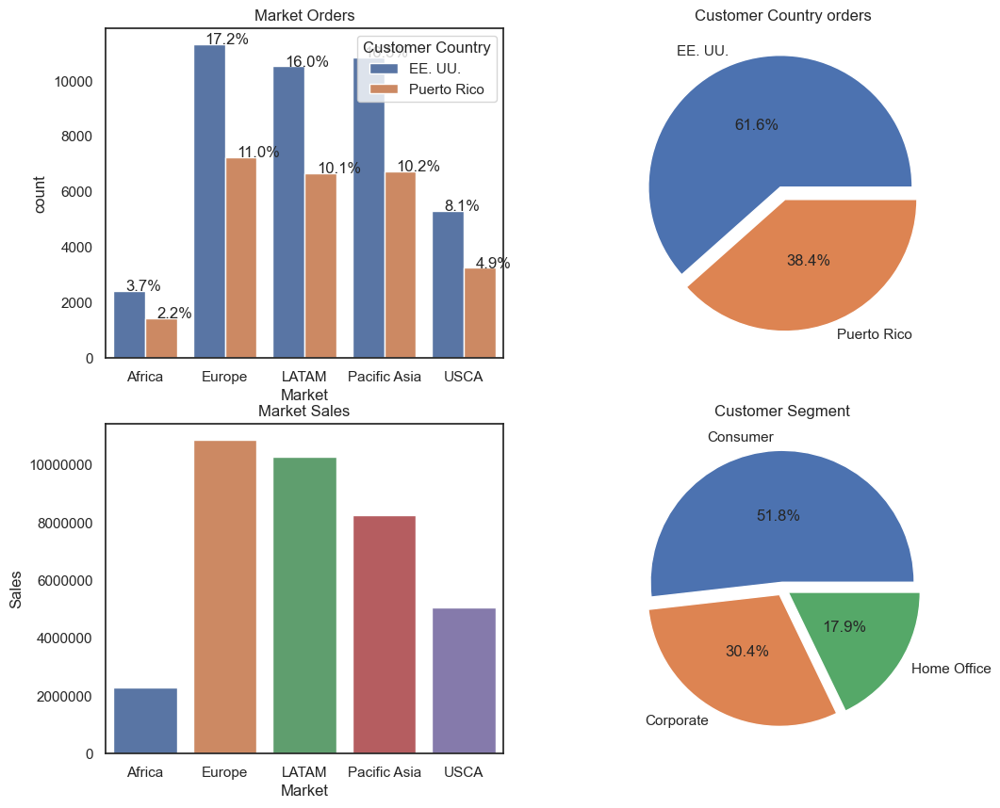

In [40]:
# Markets & Customer Analysis
# ===============================================================================================

fig = plt.figure(figsize=(12,10))

market_orders = df.groupby(['Market','Customer Country', 'Order Id'])['Sales'].sum().reset_index()
market_sales = df.groupby(['Market']).Sales.agg('sum').reset_index()
labels = df['Customer Segment'].value_counts().keys()
pie_country_labels = df['Customer Country'].value_counts().keys()



ax1 = plt.subplot2grid((2,2),(0,0))
sns.countplot(data=market_orders, x='Market', hue='Customer Country')
plt.title('Market Orders')

ax2 = plt.subplot2grid((2,2),(1,0))
sns.barplot(data=market_sales, x='Market', y='Sales')
ax2.ticklabel_format(style ='plain', axis='y') 
plt.title('Market Sales')

ax3 = plt.subplot2grid((2,2),(1,1))
plt.pie(x=df['Customer Segment'].value_counts(), autopct="%.1f%%",
        explode=[0.05]*3, labels=labels, pctdistance=0.5)
plt.title('Customer Segment')

ax4 = plt.subplot2grid((2,2),(0,1))
plt.pie(x=df['Customer Country'].value_counts(), autopct="%.1f%%",
        explode=[0.05]*2, labels=pie_country_labels, pctdistance=0.5)
plt.title('Customer Country orders')



percent(ax1, market_orders['Market']);

### Orders Analysis

#### Orders Status

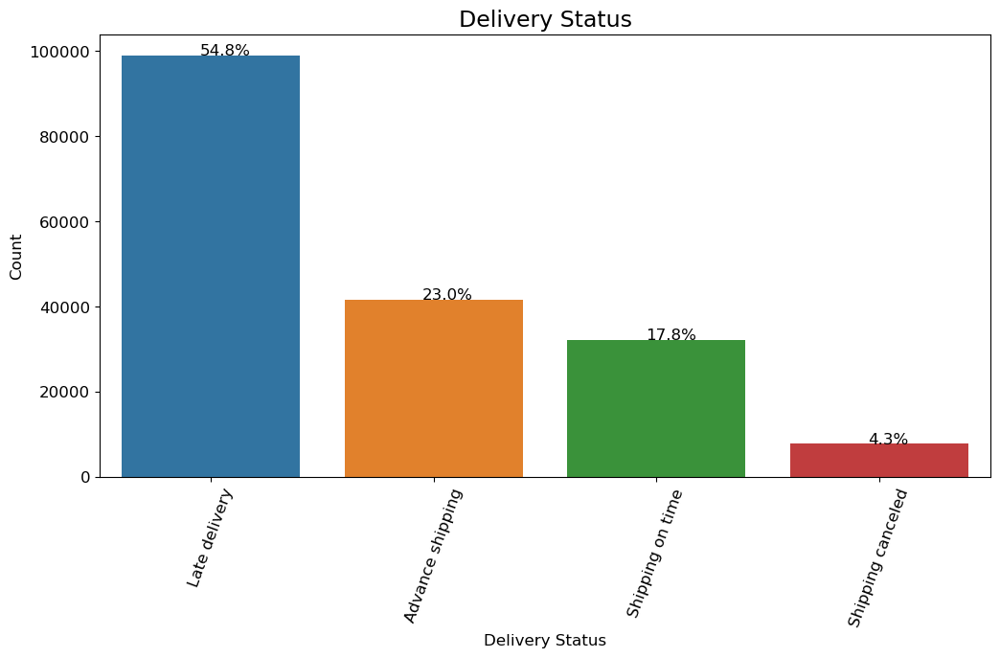

In [35]:
# Delivery Status
# ===============================================================================================

plt.figure(figsize=(12, 6))

os = sns.countplot(data=df, x="Delivery Status",
                   order=df['Delivery Status'].value_counts().index)

plt.title('Delivery Status', size=17)
plt.xticks(rotation=70, size=12)
plt.xlabel('Delivery Status', size=12)
plt.yticks(size=12)
plt.ylabel('Count', size=12)

percent(os, df['Delivery Status'])

plt.show()

#### Late Delivery

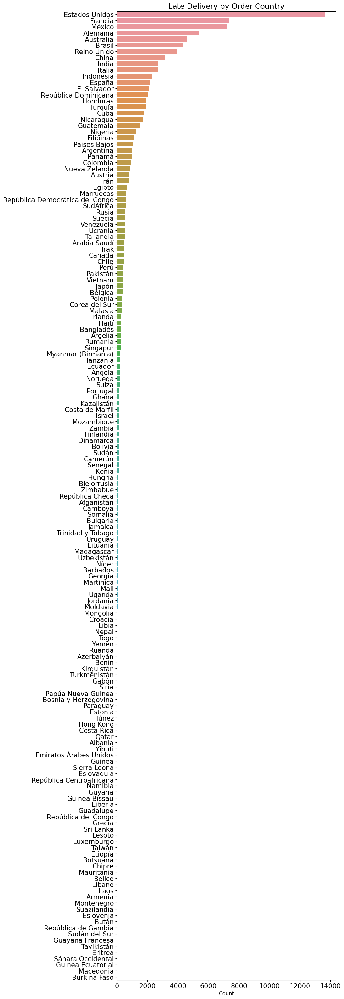

In [36]:
# Late Delivery by Order Country (Procedence)
# ===============================================================================================

plt.figure(figsize=(9, 40))

late_delivery_status_order_country = df[df['Delivery Status'] == 'Late delivery'].groupby(
    ['Order Country'])['Order Id'].count().reset_index()

os5 = sns.barplot(data=late_delivery_status_order_country, y='Order Country',
                  x='Order Id', order=late_delivery_status_order_country.sort_values('Order Id', ascending=False)['Order Country'])

plt.title('Late Delivery by Order Country', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

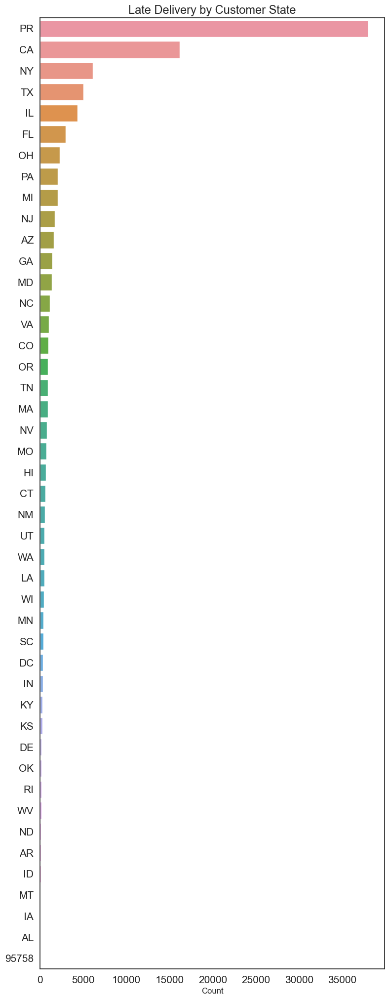

In [47]:
# Late Delivery by Customer State (Destination)
# ===============================================================================================

plt.figure(figsize=(9, 25))

late_delivery_status_customer_state = df[df['Delivery Status'] == 'Late delivery'].groupby(
    ['Customer State'])['Order Id'].count().reset_index()

os5 = sns.barplot(data=late_delivery_status_customer_state, y='Customer State',
                  x='Order Id', order=late_delivery_status_customer_state.sort_values('Order Id', ascending=False)['Customer State'])

plt.title('Late Delivery by Customer State', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);


####  Orders Canceled by Customers 

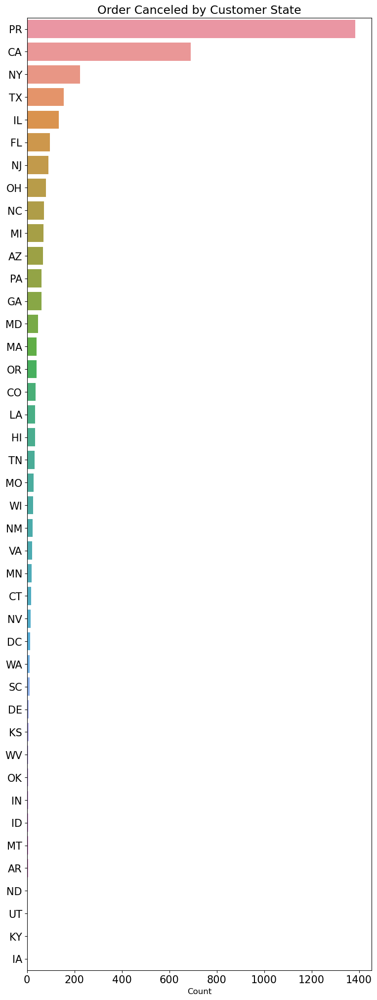

In [37]:
# Orders Canceled by Customer State (Destination)
# ===============================================================================================

plt.figure(figsize=(9, 25))

order_canceled_state = df[df['Order Status'] == 'CANCELED'].groupby(
    ['Customer State'])['Order Id'].count().reset_index()

os3 = sns.barplot(data=order_canceled_state, y='Customer State',
                  x='Order Id', order=order_canceled_state.sort_values('Order Id', ascending=False)['Customer State'])

plt.title('Order Canceled by Customer State', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

#### Orders Suspected Fraud

In [49]:
suspected_fraud = df[df['Order Status'] == 'SUSPECTED_FRAUD']

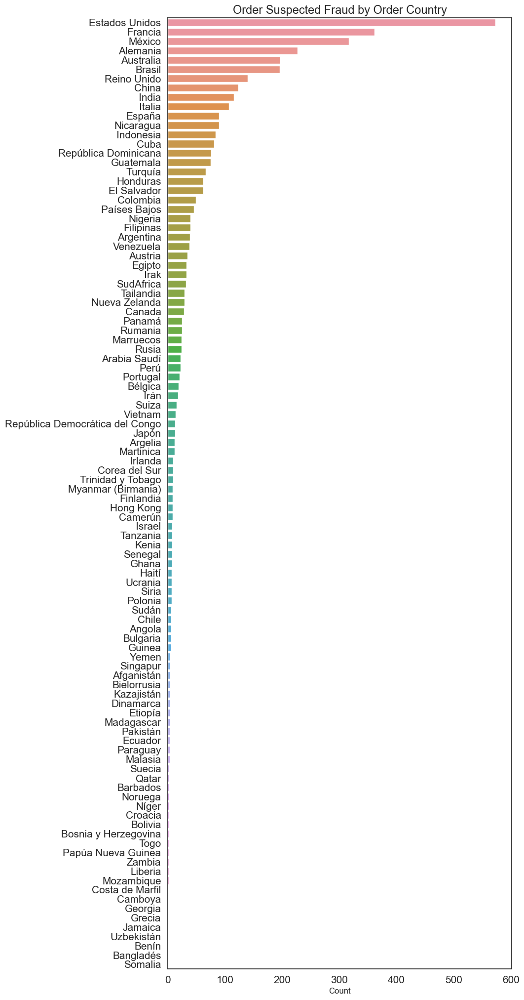

In [50]:
# Order Suspected Fraud by Order Country (Procedence)
# ===============================================================================================

plt.figure(figsize=(9, 25))

suspected_fraud_order_country = suspected_fraud.groupby(
    ['Order Country'])['Order Id'].count().reset_index()

os2 = sns.barplot(data=suspected_fraud_order_country, y='Order Country',
                  x='Order Id', order=suspected_fraud_order_country.sort_values('Order Id', ascending=False)['Order Country'])

plt.title('Order Suspected Fraud by Order Country', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);


Text(0, 0.5, '')

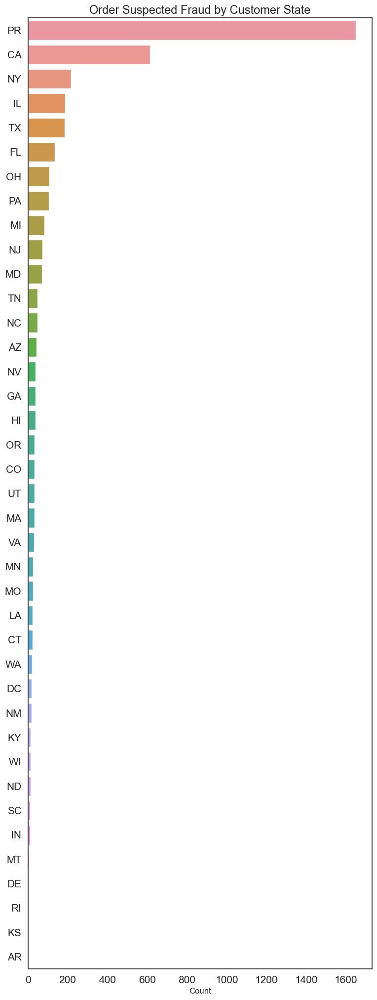

In [51]:
# Order Suspected Fraud by Customer State (Destination)
# ===============================================================================================

plt.figure(figsize=(9, 25))

suspected_fraud_state = suspected_fraud.groupby(
    ['Customer State'])['Order Id'].count().reset_index()

os3 = sns.barplot(data=suspected_fraud_state, y='Customer State',
                  x='Order Id', order=suspected_fraud_state.sort_values('Order Id', ascending=False)['Customer State'])

plt.title('Order Suspected Fraud by Customer State', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12)

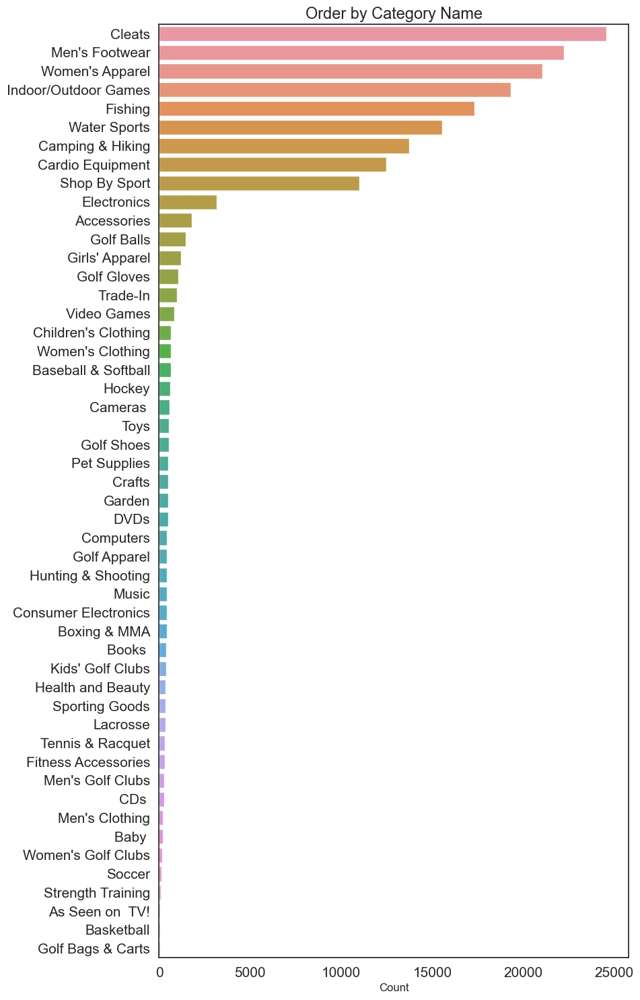

In [52]:
# Order by Category Name
# ===============================================================================================

plt.figure(figsize=(9, 18))

df_cat_prod = df.groupby(
    ['Category Name'])['Order Id'].count().reset_index()

os5 = sns.barplot(data=df_cat_prod, y='Category Name',
                  x='Order Id', order=df_cat_prod.sort_values('Order Id', ascending=False)['Category Name'])

plt.title('Order by Category Name', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

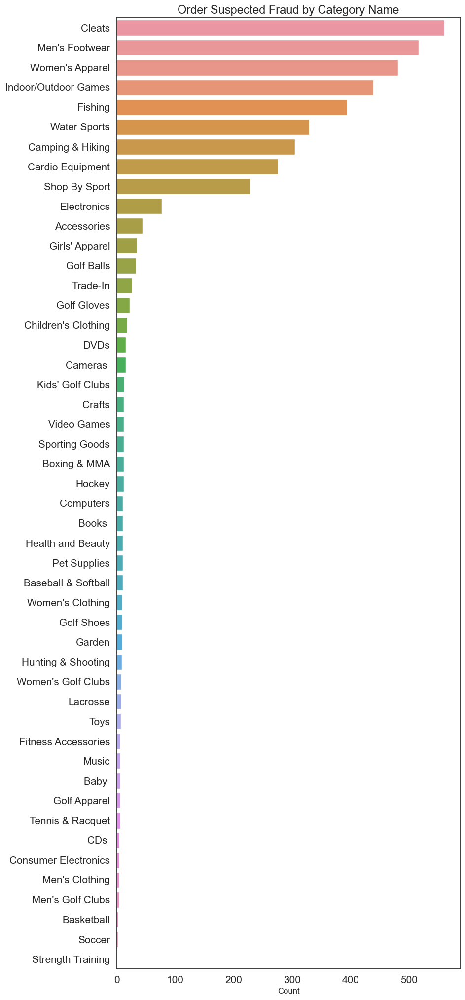

In [53]:
# Order Suspect Fraud by Category Name
# ===============================================================================================

plt.figure(figsize=(9, 25))

suspected_fraud_cat_prod = suspected_fraud.groupby(
    ['Category Name'])['Order Id'].count().reset_index()

os4 = sns.barplot(data=suspected_fraud_cat_prod, y='Category Name',
                  x='Order Id', order=suspected_fraud_cat_prod.sort_values('Order Id', ascending=False)['Category Name'])

plt.title('Order Suspected Fraud by Category Name', size=17)

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

### Sales

 #### Annual Sales

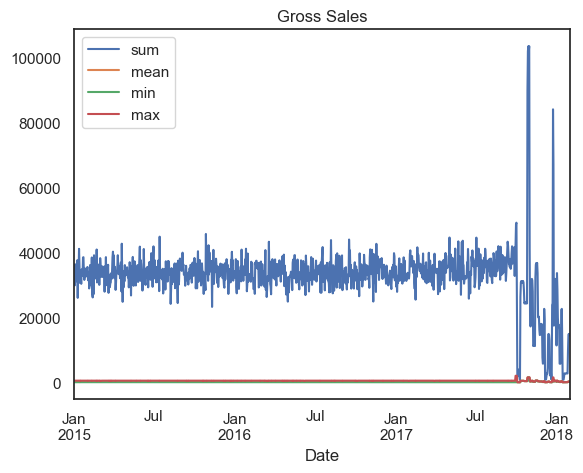

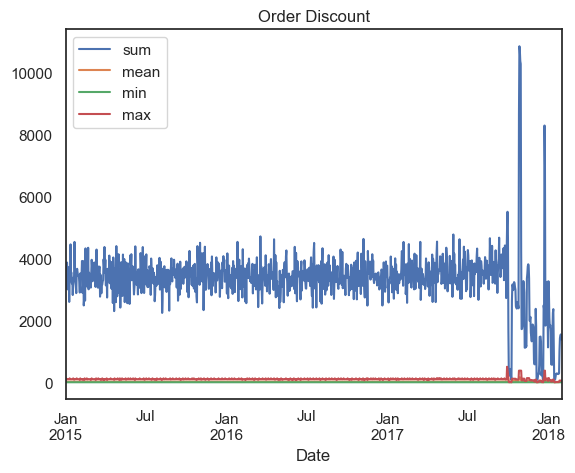

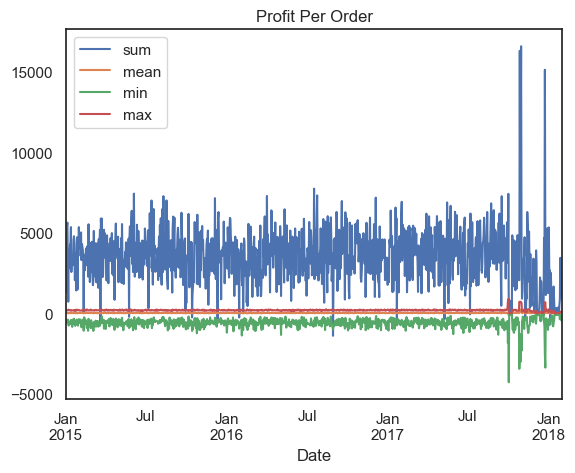

In [54]:
# Gross Sales, Discounts & Profits - Picks & Troughs
# ===============================================================================================

df_numerical_data.Sales.plot()
plt.title('Gross Sales')

df_numerical_data['Order Item Discount'].plot()
plt.title('Order Discount')

df_numerical_data['Order Profit Per Order'].plot();
plt.title('Profit Per Order');

#### Last Period (Particular Pattern)

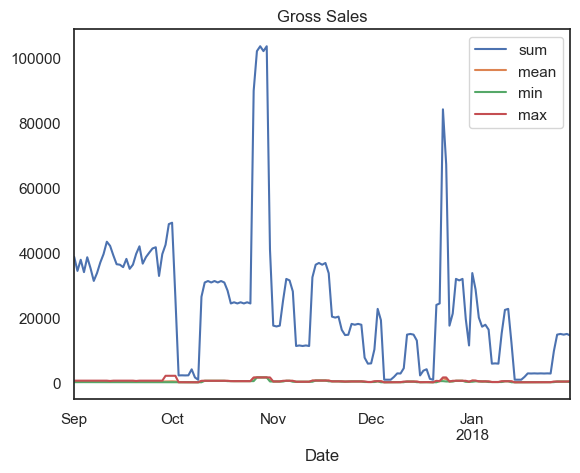

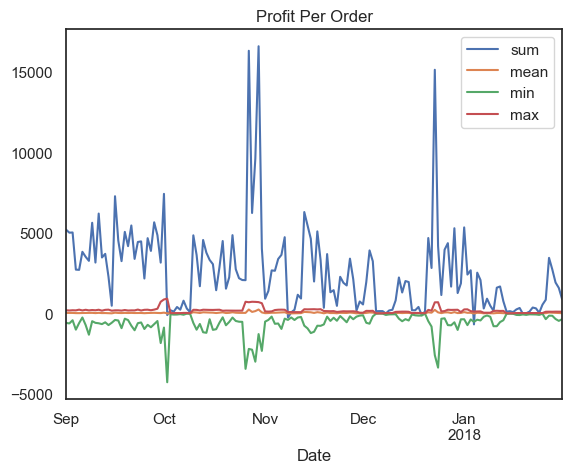

In [55]:
# Gross Sales & Profits - Picks & Troughs
# ===============================================================================================

df_numerical_data['2017-09-01':].Sales.plot()
plt.title('Gross Sales');

df_numerical_data['2017-09-01':]['Order Profit Per Order'].plot()
plt.title('Profit Per Order');

#### Daily Sales

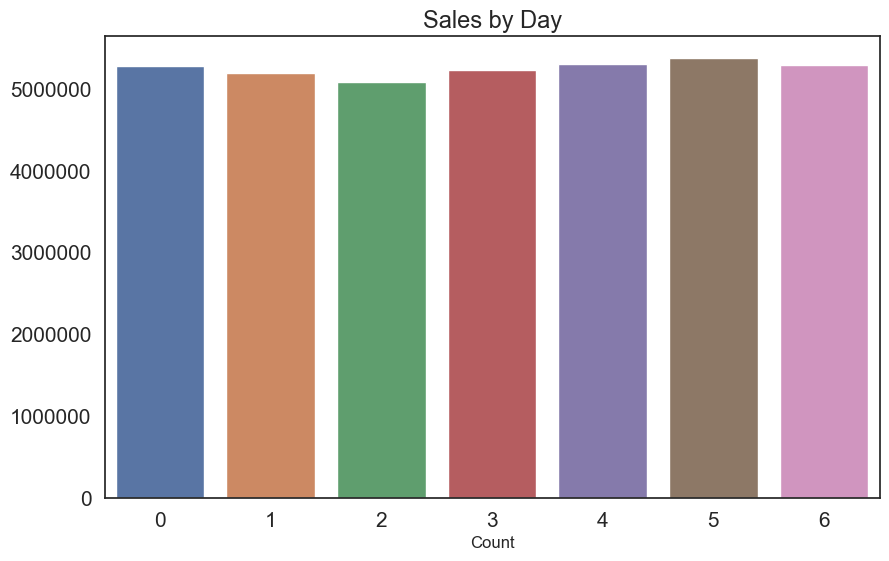

In [56]:
# Sales by Day
# ===============================================================================================

plt.figure(figsize=(10, 6))

sales_day = df.groupby('Day')['Sales'].sum().reset_index()

os61 = sns.barplot(data=sales_day, y='Sales',
                  x='Day')

plt.title('Sales by Day', size=17)
plt.ticklabel_format(style ='plain', axis='y')

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

#### Hourly Sales

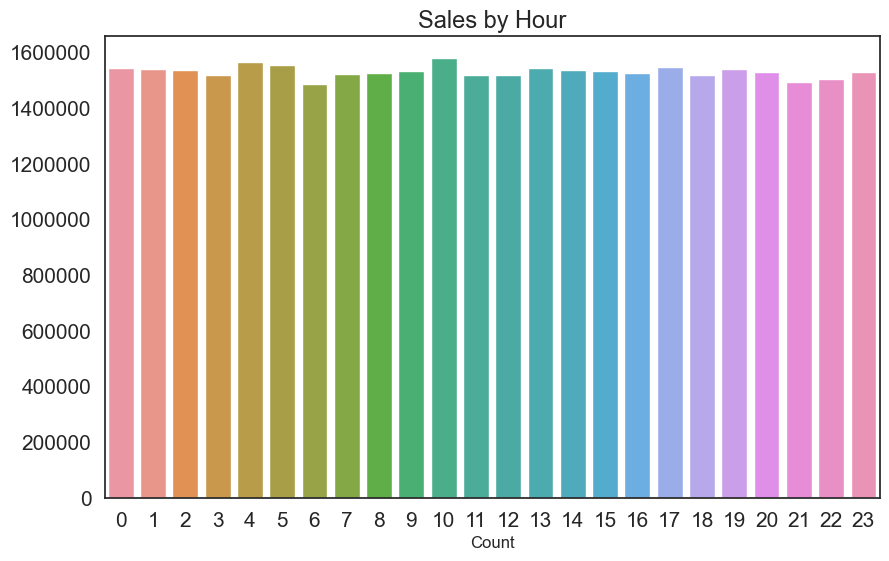

In [57]:
# Sales by Hour
# ===============================================================================================

plt.figure(figsize=(10,6))

sales_hour = df.groupby('Hour')['Sales'].sum().reset_index()

os61 = sns.barplot(data=sales_hour, y='Sales',
                  x='Hour')

plt.title('Sales by Hour', size=17)
plt.ticklabel_format(style ='plain', axis='y')

plt.xticks(size=15)
plt.xlabel('Count', size=12)

plt.yticks(size=15)
plt.ylabel('', size=12);

### Anomalies

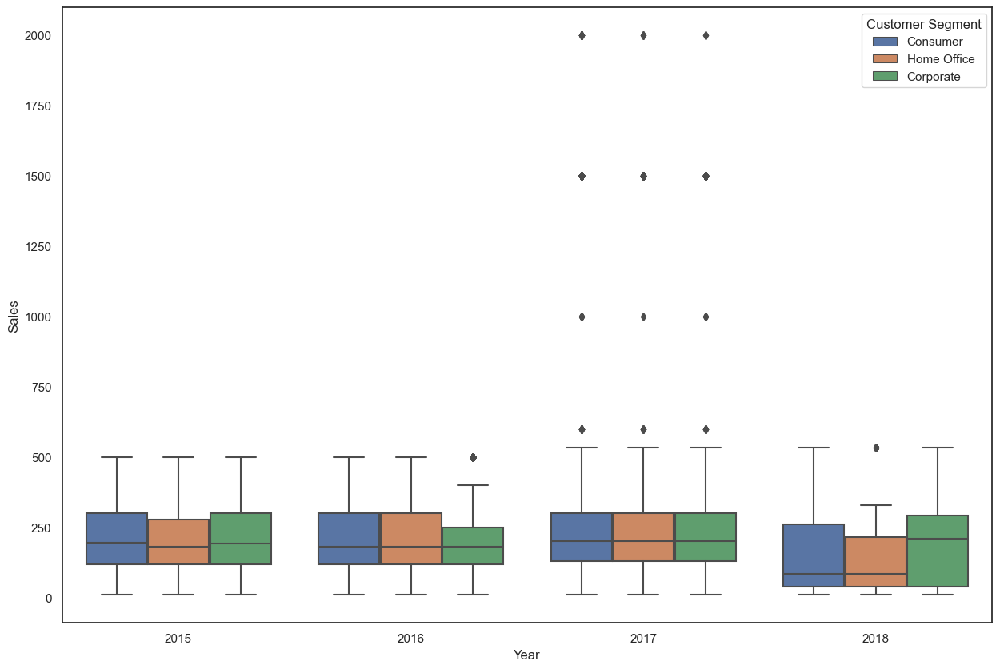

In [88]:
# Sales per year by Customer Segment 
# ===============================================================================================

plt.figure(figsize=(15,10))

sns.boxplot(x='Year', y='Sales', hue='Customer Segment', data=df);


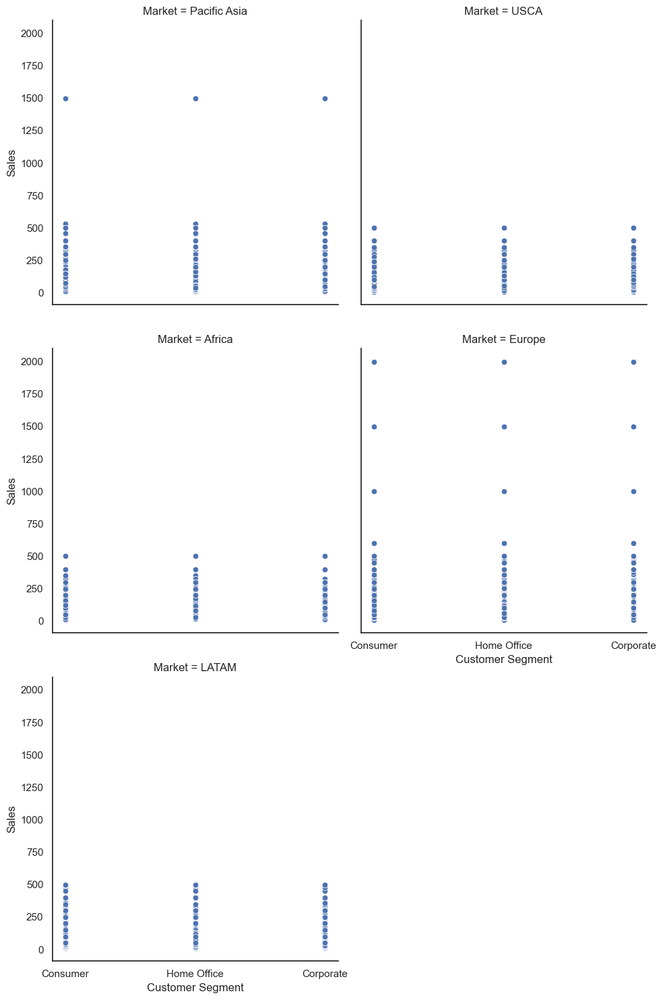

In [75]:
# Sales per Customer Segment by Market
# ===============================================================================================

sns.relplot(
    x='Customer Segment',
    y='Sales',
    data=df,
    kind='scatter',
    col='Market',
    col_wrap=2);

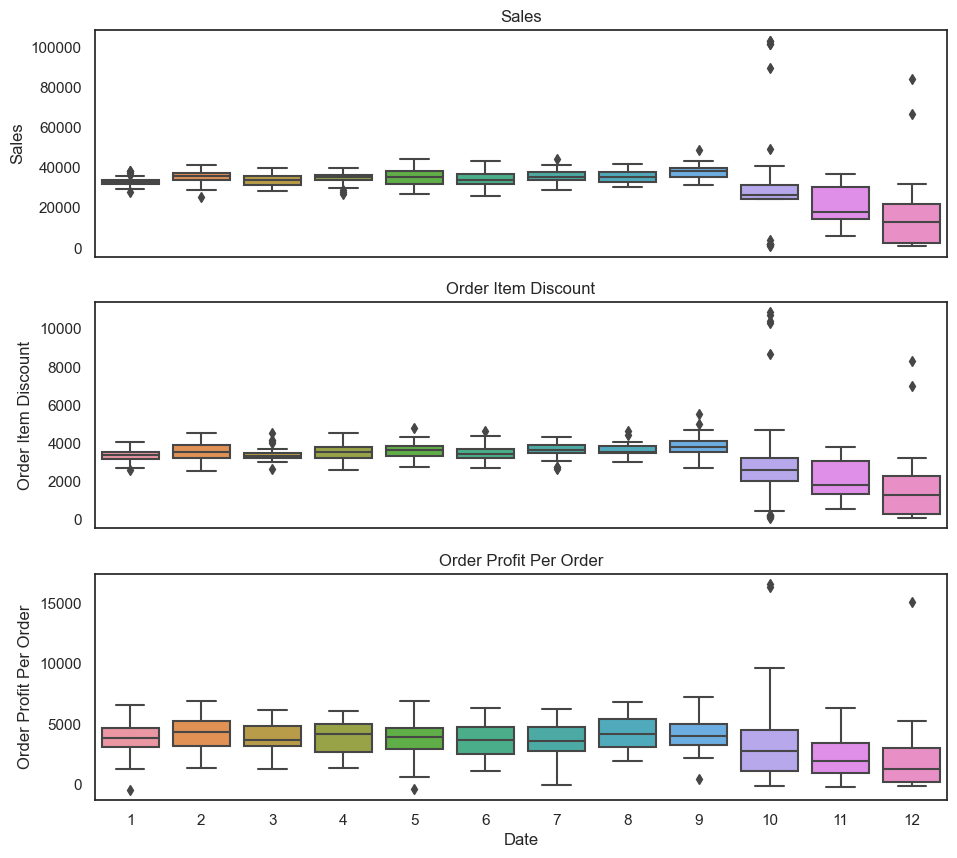

In [78]:
# Observing particular patterns in 2017
# ===============================================================================================

df_financial_2017 = df_financial['2017']

fig, ejes = plt.subplots(3, 1, figsize=(11, 10), sharex=True)
for nombre, eje in zip(['Sales', 'Order Item Discount', 'Order Profit Per Order'], ejes):
    sns.boxplot(data=df_financial_2017, x=df_financial_2017.index.month, y=nombre, ax=eje)
    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')

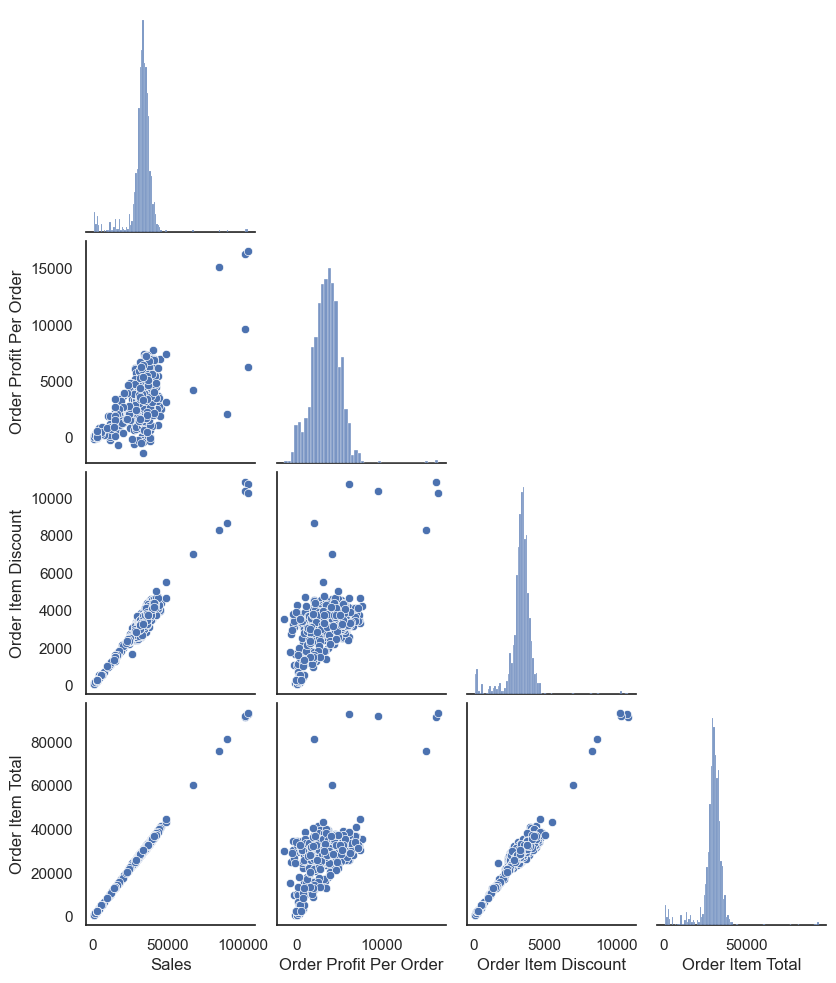

In [87]:
# Relation between numerical data - Daily
# ===============================================================================================

sns.pairplot(df_financial, corner=True, aspect=.85);